# Problem Statement

Task 1:-Prepare a complete data analysis report on the given data.

Task 2:-Create a predictive model which will help the bank to identify which customer will make transactions in future.


# Import necessary libraries

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Step 1: Load the Dataset

In [6]:
data = pd.read_csv("train(1).csv")
data

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


**Dataset Overview**
- The dataset consists of 200,000 entries and 202 columns.
- The columns include one identifier (ID_code), one object column, and 200 numerical columns (var_1 to var_199), which represent various features.
- The data type of most columns is float64, with one int64 column and one object column.
- The memory usage of the dataset is 308.2+ MB.

In [9]:
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


**DOMAIN ANALYSIS**
- with the problem of identification of the customers who will make a transaction with the bank in future, irrespective of the amount of money transacted previously with the bank, the dataset contain 200000 observation with 202 columns with 200 columns having values for var_1 to var_200, one column for ID code and one column for target

**TARGET COLUMN == TARGET [0, 1]**
- 0 Represent -- CUSTOMER DID NOT DO A TRANSACTION
- 1 Represent -- CUSTOMER DID DO THE TRANSACTION

# BASIC CHECKS

In [11]:
data.columns

Index(['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4',
       'var_5', 'var_6', 'var_7',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=202)

- **Total 202 column with target and one unique column**

In [13]:
data.index

RangeIndex(start=0, stop=200000, step=1)

In [15]:
data.shape

(200000, 202)

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


- **In this data all types of datatype is available**
- **[float,int,object]**

In [19]:
data.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


- **No constant column is present in data**

# Task 1:-Prepare a complete data analysis report on the given data.

# EDA

## **TARGET COLUMN**

In [21]:
data.target.value_counts()

target
0    179902
1     20098
Name: count, dtype: int64

**IMPORTANT NOTE:**
IN THIS DATA WE NOT DO ANY DOMAIN ANALYSIS BECAUSE OF WE DONT HAVE ANY FEATURE NAME BECAUSE THE DATA IS CONTAIN PRIVATE INFORMATION OF CUSTOMER DETAILS OF BANK

**CHECKING DISTRIBUTION OF FIRST 100 FEATURE**

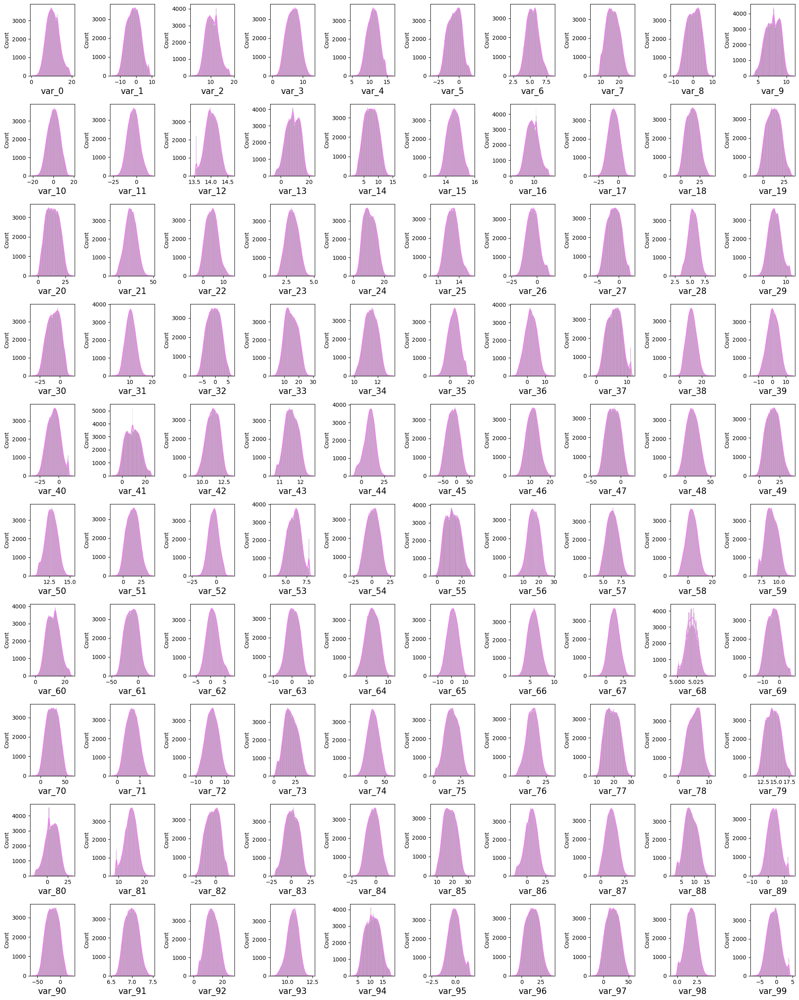

In [ ]:
dist = data.iloc[:,2:102]
plt.figure(figsize=(20,25),facecolor='white') # Define canvas size
plotno = 1 # Counter
for column in dist: # Itreting the feature
    if plotno<=100: # Condition
        plt.subplot(10,10,plotno) # plotting 100 boxplot with 10 rows and 10 columN
        sns.histplot(dist[column],kde=True,color='blue')
        plt.xlabel(column,fontsize=15) # assigning name to x-axis and font size is 20
    plotno+=1
plt.tight_layout()
plt.show() # used to hide the storage loction

**CHECKING DISTRIBUTION OF REMAINING FEATURE**

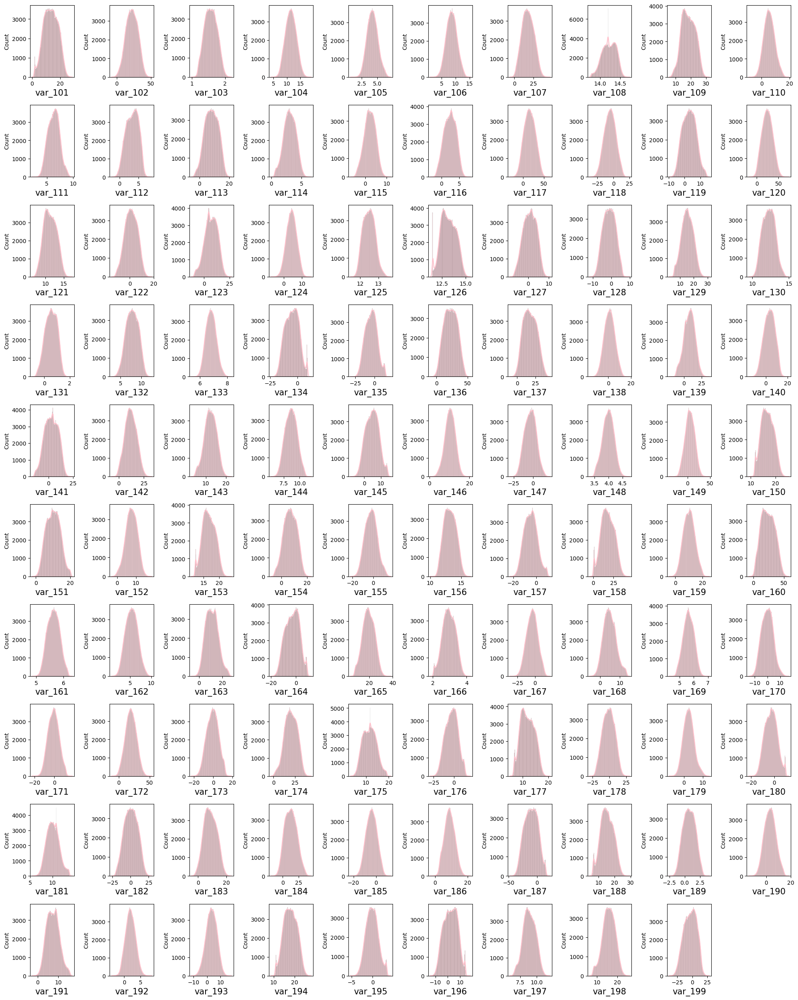

In [ ]:
dist1 = data.iloc[:,103:]
plt.figure(figsize=(20,25),facecolor='white') # Define canvas size
plotno = 1 # Counter
for column in dist1: # Itreting the feature
    if plotno<=100: # Condition
        plt.subplot(10,10,plotno) # plotting 100 boxplot with 10 rows and 10 columN
        sns.histplot(dist1[column],kde=True,color='blue')
        plt.xlabel(column,fontsize=15) # assigning name to x-axis and font size is 20
    plotno+=1
plt.tight_layout()
plt.show() # used to hide the storage loction

# OBSERVATION:
- From above both plots we are clearly see that most of the feature is follow a normal distribution and some feature are very close to the noramal distribution so we not need to use feature transformation technique.

# STATISTICAL ANALYSIS

**DISTRIBUTION OF MEAN AND STANDARD DEVIATION OF THE DATA**

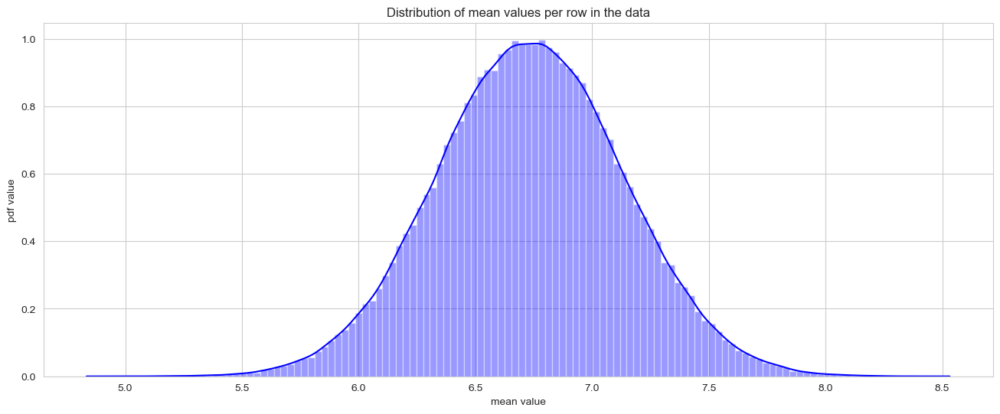

In [45]:
plt.figure(figsize=(16,6))
sns.set_style('whitegrid')
features = data.columns.values[1:202]
plt.title('Distribution of mean values per row in the data')
plt.xlabel('mean value')
plt.ylabel('pdf value')
sns.distplot(data[features].mean(axis=1),color='blue', kde=True,bins=120)
plt.show()

- From the above graph looks like guassian distribution with mean value 6.73
- From above graph we can say that around 80% feature mean lies between 6.5 to 7.0

**DISTRIBUTION OF STANDARD DEVIATION OF DATA**

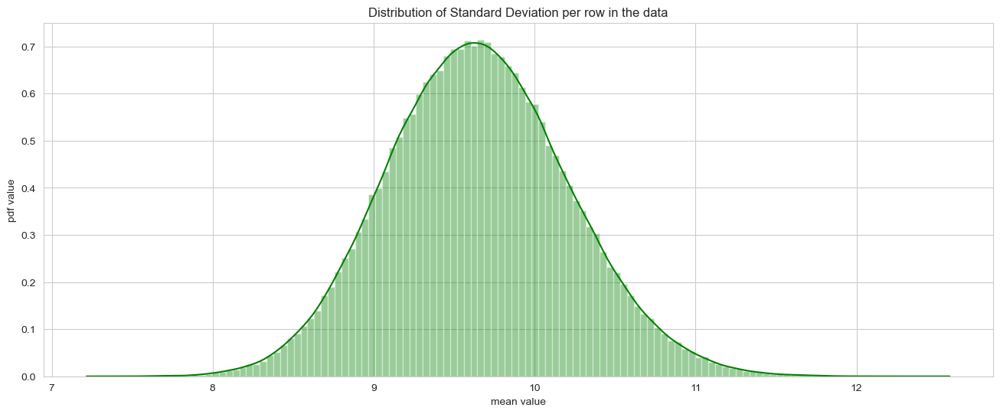

In [49]:
plt.figure(figsize=(16,6))
sns.set_style('whitegrid')
features = data.columns.values[1:202]
plt.title('Distribution of Standard Deviation per row in the data')
plt.xlabel('mean value')
plt.ylabel('pdf value')
sns.distplot(data[features].std(axis=1),color='green', kde=True,bins=120)
plt.show()

**OBSERVATION:**
- This graph also look like guassian distribution around 60% of feature standard deviation around the range of 9 to 10

# DATA PREPROCESSING / FEATURE ENIGNEERING

**1.CHECK MISSING VALUE**

In [23]:
data.isnull().sum()

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 202, dtype: int64

In [25]:
def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=['Missing Number','Missing Percentage'])
    return null_value
pd.set_option('display.max_rows',None)
missing_value(data)

,Missing Number,Missing Percentage
ID_code,0,0.0
target,0,0.0
var_0,0,0.0
var_1,0,0.0
var_2,0,0.0
var_3,0,0.0
var_4,0,0.0
var_5,0,0.0
var_6,0,0.0
var_7,0,0.0


- **In this dataset No missing available**

# 2.OUTLIER HANDLING
- From the above EDA we seen the feature are very close to the normal distribution as well as distance between point is very less so we are not impute the outlier we are use scaling to robust the outlier

# 3.FEATURE SCALING

**ROBUST SCALEING**
- Here we are use robust scaling because the data set contain the outlier but feature is follow a normal distribution
- robust scaler is similar to normalization but it insted uses the interquatile range, so that is robust to outlier


In [27]:
# Inspect the column names in your DataFrame
print(data.columns)


Index(['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4',
       'var_5', 'var_6', 'var_7',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=202)


In [29]:
from sklearn.preprocessing import RobustScaler # Import library
scaler = RobustScaler() # Object creation
data[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7','var_8','var_9','var_10','var_11','var_12','var_13',
      'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199',]] = scaler.fit_transform(data[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7',
      'var_8','var_9','var_10','var_11','var_12','var_13', 'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199']])

In [31]:
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,...,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,train_1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,...,0.686540,0.085795,0.331306,1.344064,-0.530228,1.103135,0.672394,-0.074077,0.571886,0.297368
2,train_2,0,-0.445003,-0.186541,0.395469,0.347815,-0.221094,-0.350556,1.260908,-0.356903,...,-0.046079,0.560891,-0.112102,-0.304303,0.764938,1.656951,-1.050161,-0.463036,-0.286149,0.200436
3,train_3,0,0.124444,-0.089159,-0.429020,0.120748,0.620850,0.247176,0.370517,-0.296912,...,0.195359,-0.598020,-0.574591,-0.351340,1.065039,-0.548868,-0.627542,1.047370,0.480670,-0.385163
4,train_4,0,-0.159803,0.020439,0.604761,-0.061074,0.491579,0.600549,0.449607,0.541684,...,-0.726076,0.499102,-0.996298,1.031426,-0.979782,-0.669600,0.178488,0.458709,0.487211,-0.373372


- **Scale data successfully**

#  FEATURE SELECTION

# 1.DROP UNIQUE AND CONSTANT FEATURE

- Here we are going to drop id_code

In [ ]:
data.drop('ID code',axis=1,inplace=True)

In [42]:
data.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,...,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,...,0.686540,0.085795,0.331306,1.344064,-0.530228,1.103135,0.672394,-0.074077,0.571886,0.297368
2,0,-0.445003,-0.186541,0.395469,0.347815,-0.221094,-0.350556,1.260908,-0.356903,-1.010902,...,-0.046079,0.560891,-0.112102,-0.304303,0.764938,1.656951,-1.050161,-0.463036,-0.286149,0.200436
3,0,0.124444,-0.089159,-0.429020,0.120748,0.620850,0.247176,0.370517,-0.296912,-1.190060,...,0.195359,-0.598020,-0.574591,-0.351340,1.065039,-0.548868,-0.627542,1.047370,0.480670,-0.385163
4,0,-0.159803,0.020439,0.604761,-0.061074,0.491579,0.600549,0.449607,0.541684,1.117206,...,-0.726076,0.499102,-0.996298,1.031426,-0.979782,-0.669600,0.178488,0.458709,0.487211,-0.373372


# 2.CHECKING CORRELATION

In [45]:
data.corr()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
target,1.000000,0.052390,0.050343,0.055870,0.011055,0.010915,0.030979,6.673085e-02,-0.003025,0.019584,...,0.055973,4.711368e-02,-0.042858,-0.017709,-0.022838,0.028285,0.023608,-0.035303,-0.053000,0.025434
var_0,0.052390,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,6.982549e-03,0.002429,0.004962,...,0.002752,2.058475e-04,-0.005373,0.001616,-0.001514,0.002073,0.004386,-0.000753,-0.005776,0.003850
var_1,0.050343,-0.000544,1.000000,0.003980,0.000010,0.000303,-0.000902,3.257729e-03,0.001511,0.004098,...,0.006627,3.620972e-03,-0.002604,0.001153,-0.002557,-0.000785,-0.000377,-0.004157,-0.004861,0.002287
var_2,0.055870,0.006573,0.003980,1.000000,0.001001,0.000723,0.001569,8.825211e-04,-0.000991,0.002648,...,0.000197,1.284570e-03,-0.003400,0.000549,0.002104,-0.001070,0.003952,0.001078,-0.000877,0.003855
var_3,0.011055,0.003801,0.000010,0.001001,1.000000,-0.000322,0.003253,-7.743892e-04,0.002500,0.003553,...,0.000151,2.445381e-03,-0.001530,-0.001699,-0.001054,0.001206,-0.002800,0.001164,-0.001651,0.000506
var_4,0.010915,0.001326,0.000303,0.000723,-0.000322,1.000000,-0.001368,4.882529e-05,0.004549,0.001194,...,0.001514,4.356636e-03,0.003347,0.000813,-0.000068,0.003706,0.000513,-0.000046,-0.001821,-0.000786
var_5,0.030979,0.003046,-0.000902,0.001569,0.003253,-0.001368,1.000000,2.587780e-03,-0.000995,0.000147,...,0.001466,-2.225330e-05,0.001116,-0.002237,-0.002543,-0.001274,0.002880,-0.000535,-0.000953,0.002767
var_6,0.066731,0.006983,0.003258,0.000883,-0.000774,0.000049,0.002588,1.000000e+00,-0.002548,-0.001188,...,0.000721,5.604217e-03,-0.002563,0.002464,-0.001141,0.001244,0.005378,-0.003565,-0.003025,0.006096
var_7,-0.003025,0.002429,0.001511,-0.000991,0.002500,0.004549,-0.000995,-2.547746e-03,1.000000,0.000814,...,-0.000337,-3.956720e-03,0.001733,0.003219,-0.000270,0.001854,0.001045,0.003466,0.000650,-0.001457
var_8,0.019584,0.004962,0.004098,0.002648,0.003553,0.001194,0.000147,-1.187995e-03,0.000814,1.000000,...,0.002923,-1.151228e-03,-0.000429,0.001414,0.001313,0.001396,-0.003242,-0.004583,0.002950,0.000854


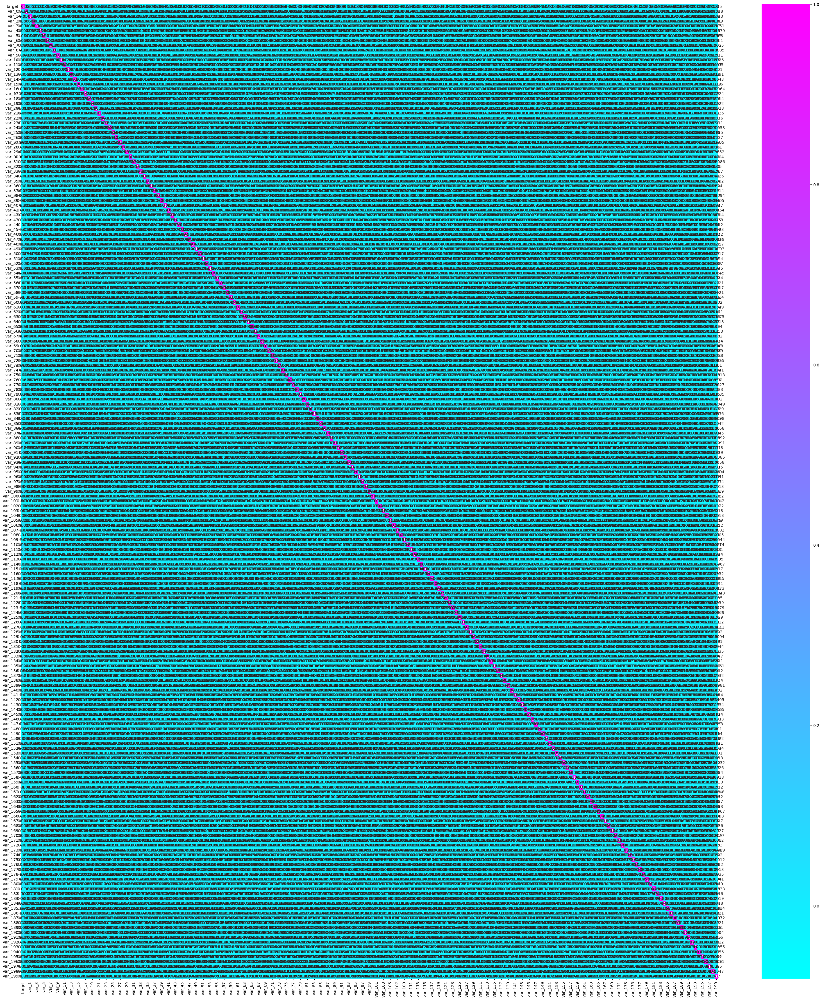

In [47]:
# Plot hitmap for better visualisation
plt.figure(figsize=(40,45))
sns.heatmap(data.corr(),annot=True,cmap='cool')
plt.show()

- From above heatmap scale we are clearly seen the their is no highly correlated feature in data
- But we confirm with the help of python code

In [ ]:
# To get highly corelated feature 
pd.set_option('display.max rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat

,feature1,feature2,corr


- Their is no highly correlated feature in dataset

# 3.CHECKING DUPLICATES

In [54]:
data.duplicated().sum()

0

- Their is no duplicates avialable on data

# 4.PRINCIPLE COMPONENT ANALYSIS

- Reduce the feature with the help of pca

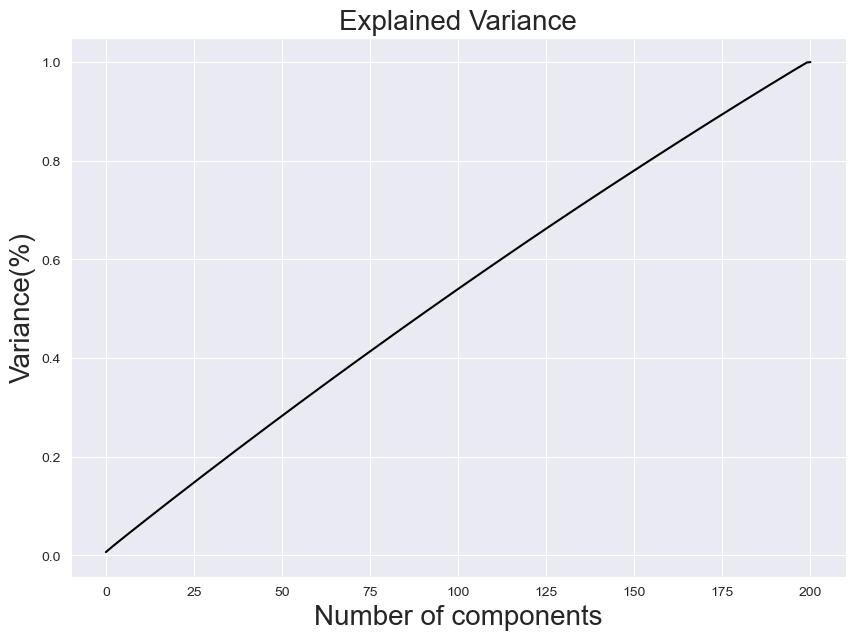

In [59]:
# Getting the optimal value of pca
from sklearn.decomposition import PCA
pca = PCA() # Object creation
principlecomponent = pca.fit_transform(data)  # Fitting the data
plt.figure(figsize=(10,7))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),color ='k')
plt.xlabel('Number of components',fontsize=20)
plt.ylabel('Variance(%)',fontsize=20) # for each componant
plt.title('Explained Variance',fontsize=20)
plt.show()

- In this plot we cleary seen the line of no of components is straight means the feature is more important so we are going to select 175 feature because of less variance loss

In [62]:
# Selecting the components
pca = PCA(n_components=175)
new_data = pca.fit_transform(data)
new_data

array([[-0.51758867,  0.26955976,  0.05402251, ...,  0.91197506,
         0.02825685, -0.01823824],
       [ 1.32400732, -0.53357927,  1.95817087, ...,  0.11897006,
        -0.04993349, -0.091531  ],
       [-0.04224386, -0.81522866, -0.3257926 , ...,  0.04433698,
        -1.15220835, -0.52020052],
       ...,
       [ 0.01423866,  0.55522966,  0.65142503, ...,  0.13624811,
        -0.40374922,  0.61777042],
       [-0.40689894,  0.23820526,  0.38221209, ..., -0.55847262,
         0.11239184, -0.75789081],
       [-0.76575485, -0.16503883,  0.39951196, ...,  1.09182605,
        -0.47622989,  0.67725346]])

In [64]:
# Create a new dataframe
principle_df = pd.DataFrame(data=new_data,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8','pca9','pca10',
                            'pca11','pca12','pca13','pca14','pca15','pca16','pca17','pca18','pca19','pca20','pca21','pca22',
                            'pca23','pca24','pca25','pca26','pca27','pca28','pca29','pca30','pca31','pca32','pca33','pca34',
                            'pca35','pca36','pca37','pca38','pca39','pca40','pca41','pca42','pca43','pca44','pca45','pca46',
                            'pca47','pca48','pca49','pca50','pca51','pca52','pca53','pca54','pca55','pca56','pca57','pca58',
                            'pca59','pca60','pca61','pca62','pca63','pca64','pca65','pca66','pca67','pca68','pca69','pca70',
                            'pca71','pca72','pca73','pca74','pca75','pca76','pca77','pca78','pca79','pca80','pca81','pca82',
                            'pca83','pca84','pca85','pca86','pca87','pca88','pca89','pca90','pca91','pca92','pca93','pca94',
                            'pca95','pca96','pca97','pca98','pca99','pca100','pca101','pca102','pca103','pca104','pca105',
                            'pca106','pca107','pca108','pca109','pca110','pca111','pca112','pca113','pca114','pca115','pca116',
                            'pca117','pca118','pca119','pca120','pca121','pca122','pca123','pca124','pca125','pca126','pca127',
                            'pca128','pca129','pca130','pca131','pca132','pca133','pca134','pca135','pca136','pca137','pca138',
                            'pca139','pca140','pca141','pca142','pca143','pca144','pca145','pca146','pca147','pca148','pca149',
                            'pca150','pca151','pca152','pca153','pca154','pca155','pca156','pca157','pca158','pca159','pca160',
                            'pca161','pca162','pca163','pca164','pca165','pca166','pca167','pca168','pca169','pca170',
                            'pca171','pca172','pca173','pca174','pca175'])
principle_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,...,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,-0.517589,0.269560,0.054023,-0.369893,-0.835381,-0.662795,-1.319730,-1.064223,0.849499,0.433281,...,0.554410,-0.611039,-1.112001,0.258308,0.751815,-0.967646,-0.750007,0.911975,0.028257,-0.018238
1,1.324007,-0.533579,1.958171,1.308587,-0.328150,-0.049564,1.179654,-0.139923,-0.443926,0.601061,...,0.807269,0.357139,1.262798,0.132334,-0.126031,-0.782291,0.295756,0.118970,-0.049933,-0.091531
2,-0.042244,-0.815229,-0.325793,0.225673,0.013017,-0.143188,-0.106796,0.226355,0.768914,0.082743,...,-0.571805,0.691044,-0.271241,0.335684,0.558622,-0.601425,-0.833146,0.044337,-1.152208,-0.520201
3,1.384955,0.367701,0.459503,-0.644095,-0.384638,0.117310,1.266890,-0.159772,-0.618706,0.584172,...,-1.503312,0.682461,0.035037,-0.304494,0.194574,0.874634,-0.182145,-0.717708,0.512492,0.430749
4,0.592824,-0.160891,0.584662,-0.840627,0.147873,-0.404153,-0.678792,0.868974,0.354538,-0.451727,...,0.459845,-0.455293,0.147366,-1.475875,-0.264492,-0.164119,-0.102101,-0.239766,-0.584007,-0.161014


# Task 2:-Create a predictive model which will help the bank to identify which customer will make transactions in future.

# MODEL CREATION

# AIM
- In customer transaction prediction f1 score metrix is important so we need more focus to improve f1 score
- Create a sweet spot model (Low bias, Low variance)

**HERE WE WILL BE EXPERIMENTING WITH FOUR ALGORITHM**
1. Logistic Regression
3. Artificial Neural Network [MLP Classifier]
3. XGB Classifier

**DEFINE INDEPENDANT AND DEPENDANT VERIABLE**

In [72]:
X = principle_df
y = data.target

In [74]:
X.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,...,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,-0.517589,0.269560,0.054023,-0.369893,-0.835381,-0.662795,-1.319730,-1.064223,0.849499,0.433281,...,0.554410,-0.611039,-1.112001,0.258308,0.751815,-0.967646,-0.750007,0.911975,0.028257,-0.018238
1,1.324007,-0.533579,1.958171,1.308587,-0.328150,-0.049564,1.179654,-0.139923,-0.443926,0.601061,...,0.807269,0.357139,1.262798,0.132334,-0.126031,-0.782291,0.295756,0.118970,-0.049933,-0.091531
2,-0.042244,-0.815229,-0.325793,0.225673,0.013017,-0.143188,-0.106796,0.226355,0.768914,0.082743,...,-0.571805,0.691044,-0.271241,0.335684,0.558622,-0.601425,-0.833146,0.044337,-1.152208,-0.520201
3,1.384955,0.367701,0.459503,-0.644095,-0.384638,0.117310,1.266890,-0.159772,-0.618706,0.584172,...,-1.503312,0.682461,0.035037,-0.304494,0.194574,0.874634,-0.182145,-0.717708,0.512492,0.430749
4,0.592824,-0.160891,0.584662,-0.840627,0.147873,-0.404153,-0.678792,0.868974,0.354538,-0.451727,...,0.459845,-0.455293,0.147366,-1.475875,-0.264492,-0.164119,-0.102101,-0.239766,-0.584007,-0.161014


In [76]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

**BALANCING THE TARGET COLUMN USING SMOTE**

In [81]:
from collections import Counter
from imblearn.over_sampling import SMOTE #SMOTE(synthetic minority oversampling techinque)
sm = SMOTE() # obeject creation
print("unbalanced data   :  ",Counter(y))
X_sm,y_sm = sm.fit_resample(X,y)
print("balanced data:    :",Counter(y_sm))

unbalanced data   :   Counter({0: 179902, 1: 20098})
balanced data:    : Counter({0: 179902, 1: 179902})


# **SPLIT TRAINING AND TESTING DATA**

In [86]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X_sm,y_sm,random_state=42,test_size=0.30) 
# 30% data given to testing because the large amount of data

In [89]:
# Check shape of train and test
X_train.shape

(251862, 175)

In [91]:
X_test.shape

(107942, 175)

In [93]:
y_train.shape

(251862,)

In [95]:
y_test.shape

(107942,)

# 1.Logistic Regression

In [98]:
#Step:1 importing library
from sklearn.linear_model import LogisticRegression

# Step:2 Object creation 
log_reg = LogisticRegression()

# Step:3 fitting traing data
log_reg.fit(X_train,y_train)

# Step:4 Prediction on test data
log_test_predict = log_reg.predict(X_test)

# Step:5 Prediction on training data
log_train_predict = log_reg.predict(X_train)

**EVALUATION**

**TRAINING ACCURACY**

In [104]:
# Import library
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,classification_report,confusion_matrix
log_train_accuracy = accuracy_score(log_train_predict,y_train)
print("Training accuracy of Logistic regression model",log_train_accuracy*100)
print("Logistic regression training Classification report: \n",classification_report(log_train_predict,y_train))

Training accuracy of Logistic regression model 83.48143030707293
Logistic regression training Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83    123976
           1       0.84      0.83      0.84    127886

    accuracy                           0.83    251862
   macro avg       0.83      0.83      0.83    251862
weighted avg       0.83      0.83      0.83    251862



- **Logistic regression training score is very poor**

**TESTING ACCURACY**

In [110]:
log_test_accuracy = accuracy_score(log_test_predict,y_test)
print("Testing accuracy of Logistic regression model",log_test_accuracy*100)
print("Logistic regression testing Classification report: \n",classification_report(log_test_predict,y_test))

Testing accuracy of Logistic regression model 83.55135165181301
Logistic regression testing Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83     53079
           1       0.84      0.83      0.84     54863

    accuracy                           0.84    107942
   macro avg       0.84      0.84      0.84    107942
weighted avg       0.84      0.84      0.84    107942



- **Testing accuracy of logistic regression model is poor**

# 2.ANN [MLP Classifier]

In [122]:
# Step:1 Importing library and object creation
from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(60,3),
                      learning_rate='constant',
                      max_iter=100,
                      random_state=42)

In [124]:
# Step:2 Fitting the training data
model.fit(X_train,y_train)

MLPClassifier(hidden_layer_sizes=(60, 3), max_iter=100, random_state=42)

In [126]:
# Step:3 Predicting the probability
mlp_prdict_probability = model.predict_proba(X_test)
mlp_prdict_probability

array([[0.99427501, 0.00572499],
       [0.15222587, 0.84777413],
       [0.01388569, 0.98611431],
       ...,
       [0.00292808, 0.99707192],
       [0.99567569, 0.00432431],
       [0.99859669, 0.00140331]])

In [128]:
# Step:4 Prediction on test data
mlp_test_predict = model.predict(X_test)

# Step:5 Prediction on training data
mlp_train_predict = model.predict(X_train)

**EVALUATION**

**TRAINING ACCURACY**

In [136]:
mlp_train_accuracy = accuracy_score(mlp_train_predict,y_train)
print("Training accuracy of MLP model is:",mlp_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(mlp_train_predict,y_train))

Training accuracy of MLP model is: 93.68146048232762
Classification report of training:
               precision    recall  f1-score   support

           0       0.94      0.94      0.94    125550
           1       0.94      0.94      0.94    126312

    accuracy                           0.94    251862
   macro avg       0.94      0.94      0.94    251862
weighted avg       0.94      0.94      0.94    251862



- ANN MLP classifier model is very well work on training data

**TESTING ACCURACY**

In [140]:
mlp_test_accuracy = accuracy_score(mlp_test_predict,y_test)
print("Testing accuracy of MLP model is:",mlp_test_accuracy*100)
print("Classification report of testing:"'\n',classification_report(mlp_test_predict,y_test))

Testing accuracy of MLP model is: 90.42263437772137
Classification report of testing:
               precision    recall  f1-score   support

           0       0.90      0.91      0.90     53250
           1       0.91      0.90      0.90     54692

    accuracy                           0.90    107942
   macro avg       0.90      0.90      0.90    107942
weighted avg       0.90      0.90      0.90    107942



In [142]:
mlp_f1_score = f1_score(mlp_test_predict,y_test)
print('F1 Score',mlp_f1_score*100)

F1 Score 90.48381751905445


- ANN MLP classifier model testing accuracy also good.

# 3.XGB Classifier

In [146]:
# Step:1 importing library and object creation
import xgboost
from xgboost import XGBClassifier
xgb = XGBClassifier()

# Step:2 fitting the training data
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [148]:
# Step:3 Prediction on training data
xgb_train_predict = xgb.predict(X_train)

# Step:4 Prediction on testing data
xgb_test_predict = xgb.predict(X_test)

**EVALUATION**

**TRAINING ACCURACY**

In [154]:
xgb_train_accuracy = accuracy_score(xgb_train_predict,y_train)
print("Training accuracy XGB classifier:",xgb_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(xgb_train_predict,y_train))

Training accuracy XGB classifier: 93.67907822537738
Classification report of training:
               precision    recall  f1-score   support

           0       0.93      0.94      0.94    124996
           1       0.94      0.93      0.94    126866

    accuracy                           0.94    251862
   macro avg       0.94      0.94      0.94    251862
weighted avg       0.94      0.94      0.94    251862



- XGB Classifier model also very well work on training data

**TESTING ACCURACY**

In [158]:
xgb_test_accuracy = accuracy_score(xgb_test_predict,y_test)
print("Testing accuracy XGB classifier:",xgb_test_accuracy*100)
print("Classification report of training:"'\n',classification_report(xgb_test_predict,y_test))

Testing accuracy XGB classifier: 90.48655759574586
Classification report of training:
               precision    recall  f1-score   support

           0       0.90      0.91      0.90     53111
           1       0.91      0.90      0.91     54831

    accuracy                           0.90    107942
   macro avg       0.90      0.90      0.90    107942
weighted avg       0.90      0.90      0.90    107942



In [160]:
xgb_f1_score = f1_score(xgb_test_predict,y_test)
print("F1 score of xgb:",xgb_f1_score*100)

F1 score of xgb: 90.55941162951045


- XGB Classifier model accuracy score is also good.

In [163]:
# Define the performance metrics
data = {
    'Model': ['Logistic Regression', 'MLP', 'XGBoost'],
    'Training Accuracy (%)': [log_train_accuracy * 100, mlp_train_accuracy * 100, xgb_train_accuracy * 100],
    'Testing Accuracy (%)': [log_test_accuracy * 100, mlp_test_accuracy * 100, xgb_test_accuracy * 100],
    'F1 Score (%)': [log_f1_score * 100, mlp_f1_score * 100, xgb_f1_score * 100]
}

# Create a DataFrame
df = pd.DataFrame(data)

# Display the DataFrame
print(df)

                 Model  Training Accuracy (%)  Testing Accuracy (%)  \
0  Logistic Regression              83.481430             83.551352   
1                  MLP              93.681460             90.422634   
2              XGBoost              93.679078             90.486558   

   F1 Score (%)  
0     82.981244  
1     90.483818  
2     90.559412  


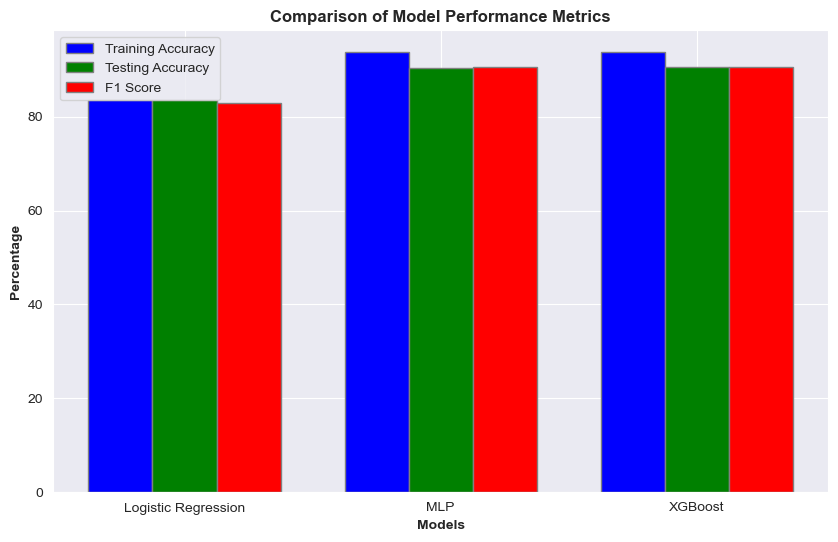

In [165]:
import matplotlib.pyplot as plt
import numpy as np

# Define the performance metrics
models = ['Logistic Regression', 'MLP', 'XGBoost']
training_accuracy = [log_train_accuracy * 100, mlp_train_accuracy * 100, xgb_train_accuracy * 100]
testing_accuracy = [log_test_accuracy * 100, mlp_test_accuracy * 100, xgb_test_accuracy * 100]
f1_scores = [log_f1_score * 100, mlp_f1_score * 100, xgb_f1_score * 100]

# Set the width of the bars
bar_width = 0.25

# Set the positions of the bars on the x-axis
r1 = np.arange(len(models))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(r1, training_accuracy, color='blue', width=bar_width, edgecolor='grey', label='Training Accuracy')
plt.bar(r2, testing_accuracy, color='green', width=bar_width, edgecolor='grey', label='Testing Accuracy')
plt.bar(r3, f1_scores, color='red', width=bar_width, edgecolor='grey', label='F1 Score')

# Add labels
plt.xlabel('Models', fontweight='bold')
plt.ylabel('Percentage', fontweight='bold')
plt.title('Comparison of Model Performance Metrics', fontweight='bold')
plt.xticks([r + bar_width for r in range(len(models))], models)

# Add legend
plt.legend()

# Display the chart
plt.show()


 **Conclusion**
- Best Model:
    - The XGBoost Classifier is recommended due to its superior testing accuracy (90.60%) and balanced performance metrics (precision, recall, F1-score).
- Data Insights:
   - Most features are normally distributed with no significant correlation, allowing effective scaling and model performance.
- Future Work:
    - Explore optimized hyperparameter tuning using techniques like Grid Search with Cross-Validation or Bayesian Optimization to further improve model accuracy.
    - Consider distributed computing or cloud-based solutions to handle large datasets efficiently.